# PRUEBA EDA 

# 🧪 Exploración de Datos Automatizada
Este notebook muestra cómo usar la clase `EDAHelper` para realizar un Análisis Exploratorio de Datos por fases.

### 📂 Estructura de Carpetas para ejecutar el EDA

In [1]:
"""
mi_proyecto/
│
├── src/
│   └── Class_EDA.py   ← Aquí está tu clase `EDAHelper`
│
├── data/
│   └── archivo.csv        ← Tu dataset
│
├── document/
│   └── eda_analysis.ipynb ← Tu notebook
│   └── Doc_Aux.ipynb ← Documento de informacio tecnica teorica
"""

'\nmi_proyecto/\n│\n├── src/\n│   └── Class_EDA.py   ← Aquí está tu clase `EDAHelper`\n│\n├── data/\n│   └── archivo.csv        ← Tu dataset\n│\n├── document/\n│   └── eda_analysis.ipynb ← Tu notebook\n│   └── Doc_Aux.ipynb ← Documento de informacio tecnica teorica\n'

# ⚙️🔧🛠️ Importaciones y carga de archivos

In [2]:
# RECURSOS
import os
import sys
import pandas as pd

# Añadir la carpeta src al path
sys.path.append(os.path.abspath(os.path.join('..', 'src')))

# Importar clase
from Class_EDA import EDAHelper

# Nombre del archivo
dataset = 'PRUEBA_DAVID_VENTAS_2024.xlsx' # ❗❗❗❗ Cambia esto por tu archivo ❗❗❗

# Ruta del archivo de datos
file_path = os.path.join('..', 'data', dataset)  

# Crear instancia y cargar datos
eda = EDAHelper(file_path)
eda.load_data()

✅ Archivo cargado correctamente: .xlsx


## 🗄️ Fase 0: Datos Crudos

In [3]:
eda.run_fase0_Datos_Crudos()

📌 FORMATEAR TITULOS COLUMNAS
----------------------------------------

✅ Titulos Columnas formateadas correctamente
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

📌 DATASET CARGADO
----------------------------------------
   Nº_pieza  Fotos                Pieza          Tipo_vehículo          Marca                                 Modelo            Motor                                            Versión  Disponible Desmontada Ubicación                 Alta  Días_stock          Fecha_venta  Precio_almacen_c/imp  Matrícula  Nº_vehículo  Kms/horas  Año  Ud/lote  Precio_venta_s/imp Ref._original_(concesionarios) Ref._paralelo_(recambistas) Usuario_eliminación     Cv   Carrocería            Combustible Cambio  Fotos_veh
0    426548    NaN        PARASOL DCHO.  TURISMO + IND. LIGERO        Renault  Megane I Fase 2 Berlina (BA0)(1999->)     K4M - #Prov#  1.6 16V Dynamique (BA01/04/11) [1,6 Ltr. - 79 kW]           0         SI       NaN  2024-02-20 00:00:00  

### 📝 Notas Fase 0

### 🧩🧹 Transformaciones Básicas

In [4]:
#- Modificamos el formato de las columnas Alta y Fecha_venta a tipo datetime
eda.df['Alta'] = pd.to_datetime(eda.df['Alta'])
eda.df['Fecha_venta'] = pd.to_datetime(eda.df['Fecha_venta'])
#- Modificamos el formato de la columna Año a tipo String
eda.df['Año'] = eda.df['Año'].astype(str)
#- Modificamos el formato de la columna Año a tipo booleano
eda.df['Desmontada'] = eda.df['Desmontada'].astype(bool)
#- Eliminamos las columnas Fotos y Fotos_veh
eda.df.drop(columns=['Fotos'], inplace=True)
eda.df.drop(columns=['Fotos_veh'], inplace=True)

### Exportar DataSet Transformado

In [5]:
#eda.df.to_csv("archivo.csv", index=False)
#eda.df.to_csv("archivo.csv", index=False, encoding='utf-8') # Si contiene tildes o caracteres especiales
#eda.df.to_parquet("archivo.parquet", index=False) # pip install pyarrow (o fastparquet)
#eda.df.to_excel("archivo.xlsx", index=False) # pip install openpyxl (para .xlsx)


## 🔍 Fase 1: Análisis Preliminar

In [6]:
eda.run_fase1_preliminar()


📐 Tamaño del DataFrame:
 Filas: 15127
 Columnas: 27

📌 Info DataSet
----------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15127 entries, 0 to 15126
Data columns (total 27 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Nº_pieza                        15127 non-null  int64         
 1   Pieza                           15127 non-null  object        
 2   Tipo_vehículo                   15127 non-null  object        
 3   Marca                           12988 non-null  object        
 4   Modelo                          12894 non-null  object        
 5   Motor                           11843 non-null  object        
 6   Versión                         12682 non-null  object        
 7   Disponible                      15127 non-null  int64         
 8   Desmontada                      15127 non-null  bool          
 9   Ubicación                   

#### 📝 Notas Fase 1:

## 🔢 Fase 2: Análisis Numérico

In [7]:
eda.run_fase2_numericas()


📈 Estadísticas básicas para variables numericas:
                      Recuento      Media    Mediana       Moda  Desviación estándar  Asimetría  Curtosis        IQR         Rango   Mínimo  Percentil 10  Percentil 25  Percentil 50  Percentil 75  Percentil 90        Máximo  Normalidad (p-valor) Normalidad
Nº_pieza               15127.0  408868.98  430861.00    5061.00             75026.76      -2.62      7.63   48447.00  4.722990e+05  5061.00     333430.40      402482.5     430861.00     450929.50     464619.80  4.773600e+05                   NaN          ❌
Disponible             15127.0  184085.00       0.00       0.00          17308905.81     103.69  11303.24       0.00  1.964642e+09    -1.00          0.00           0.0          0.00          0.00          0.00  1.964642e+09                   NaN          ❌
Días_stock             15127.0     173.37      39.00       0.00               299.89       2.58      6.85     207.00  1.684000e+03     0.00          0.00           0.0         39.


✅ Graficos Numericas generados
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

📋 RESUMEN:
[2025-07-03 23:44:56] Graficos Numericas generados


#### 📝 Notas Fase 2:

## 🔠 Fase 3: Variables Categóricas

In [8]:
#modifica el parametro para cambiar el numero de columnas de los graficos (Por defecto 15)
eda.run_fase3_categoricas(max_categorias=15) 


📊 Métricas estadísticas para variables categóricas:
                       Columna  Recuento  Nulos  % Nulos  Valores Únicos  Cardinalidad %                              Moda  Frecuencia Moda  % Moda  Entropía   Alerta Cardinalidad
                         Pieza     15127      0     0.00             775            5.12                    MOTOR COMPLETO              594    3.93      7.28   Cardinalidad normal
                 Tipo_vehículo     15127      0     0.00               1            0.01             TURISMO + IND. LIGERO            15127  100.00      0.00 Muy baja cardinalidad
                         Marca     12988   2139    14.14              45            0.30                           Citroen             1526   11.75      4.29   Cardinalidad normal
                        Modelo     12894   2233    14.76             880            5.82            Ibiza (6L1)(04.2002->)              450    3.49      8.44   Cardinalidad normal
                         Motor     11843   3284


✅ Graficos Categoricas
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

📋 RESUMEN:
[2025-07-03 23:44:56] Tabla de métricas categóricas generada
[2025-07-03 23:44:59] Graficos Categoricas


#### 📝 Notas Fase 3:

## 📆 Fase 4: Fechas y Booleanos

In [9]:
eda.run_fase4_fechas_booleans()


📌 Analisis Fechas
----------------------------------------

⏳ Alta: min = 1970-01-01 00:00:00.000043872, max = 2024-06-29 00:00:00

⏳ Fecha_venta: min = 1970-01-01 00:00:00.000045474, max = 2024-06-29 00:00:00

✅ Fechas Analizado
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

📌 Posibles columnas Booleanas
----------------------------------------

📋 RESUMEN:
[2025-07-03 23:44:59] Fechas Analizado


#### 📝 Notas Fase 4:

## 🔗 Fase 5: Correlaciones

In [10]:
eda.run_fase5_correlaciones()


✅ Mapa de correlaciones interactivo generado
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
📌 Correlacciones Fuertes
----------------------------------------

🔍 Correlaciones fuertes (>|0.7|):
Nº_pieza ↔ Días_stock: -0.96
Disponible ↔ Ud/lote: 1.00
Precio_almacen_c/imp ↔ Precio_venta_s/imp: 0.99

✅ Correlacciones Fuertes analizado
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

📋 RESUMEN:
[2025-07-03 23:44:59] Mapa de correlaciones interactivo generado
[2025-07-03 23:44:59] Correlacciones Fuertes analizado


#### 📝 Notas Fase 5:

## 🧾 Fase 6: Conclusiones Automáticas

In [11]:
eda.run_fase6_conclusiones()


📌 CONCLUSIONES DETALLADAS POR COLUMNA
----------------------------------------

🔍 COLUMNA: Nº_pieza
- 🏷️Tipo de dato: int64
- 🔸Asimetría: -2.62 → Sesgo negativo
- ⚠️Outliers detectados: 1432 → Posibles valores extremos
- 🔺Curtosis alta (7.63) → Colas pesadas
- 📋Conclusión: Columna válida para análisis

🔍 COLUMNA: Pieza
- 🏷️Tipo de dato: object
- 🔁Duplicados: 14352 (94.88%) → Revisa posibles redundancias
- 💡Alta cardinalidad: 775 valores únicos → Considera agrupar
- 📋Conclusión: Categoría con alta cardinalidad → Considerar reducción

🔍 COLUMNA: Tipo_vehículo
- 🏷️Tipo de dato: object
- 🔁Duplicados: 15126 (99.99%) → Revisa posibles redundancias
- ❌Valor constante → Puede eliminarse del análisis
- 📋Conclusión: Columna constante, poco útil

🔍 COLUMNA: Marca
- 🏷️Tipo de dato: object
- ❗ Nulos: 2139 (14.14%) → Considera imputación o eliminación
- 🔁Duplicados: 15081 (99.70%) → Revisa posibles redundancias
- 📋Conclusión: Columna válida para análisis

🔍 COLUMNA: Modelo
- 🏷️Tipo de dato: object


#### 📝 Notas Fase 6:

## 🧪 Fase Test: Análisis Univariante con Test Estadísticos

📜 ÍNDICES DE COLUMNAS DISPONIBLES:
0: Nº_pieza
1: Disponible
2: Días_stock
3: Precio_almacen_c/imp
4: Nº_vehículo
5: Kms/horas
6: Ud/lote
7: Precio_venta_s/imp
8: Cv
- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -

🔍 Análisis univariante: columna 'Precio_venta_s/imp'
------------------------------------------------------------
🧮 Resumen de métricas
- N (valores válidos): 15126 → Muestra amplia
- N (nulos): 1 → 0.0% de datos faltantes
- Media: 66.63
- Mediana: 37.19
- Moda: 41.32
- Desviación estándar: 133.76
- Varianza: 17891.87
- Skewness (Asimetría): 8.94 🚨 → sesgo positivo (cola derecha)
- Kurtosis: 131.85 🚨 → leptocúrtica (picuda, colas largas)
- Mínimo: -260.33
- Máximo: 3305.79
- Rango: 3566.12
- IQR: 27.44
- Outliers detectados: 2054

🔬📈 Test de normalidad
Kolmogorov-Smirnov:
- Estadístico = 0.997
- p = 0.00000
Anderson-Darling:
- Estadístico = 2928.319
→ ❌ No distribución normal según KS y/o AD

🔬📉 Tests adicionales
- Test simetría: es

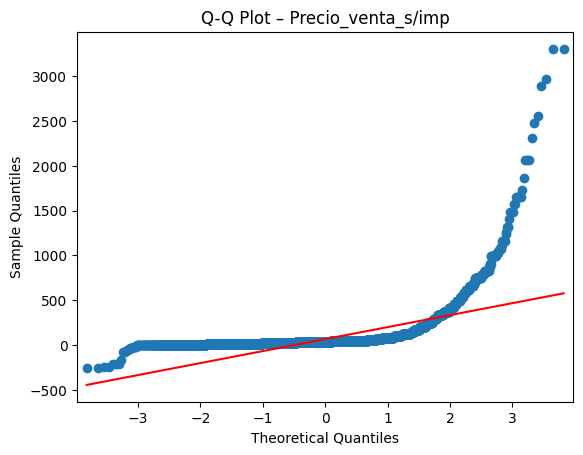


✅ Completado Análisis Univariante de 'Precio_venta_s/imp'
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

📋 RESUMEN:
[2025-07-03 23:45:02] Completado Análisis Univariante de 'Precio_venta_s/imp'


In [12]:
'DESCOMENTAR PARA EJECUTAR TEST'
eda.run_fase_test_univariante()

#### 📝 Notas Test Univariante:

## 🧪 Fase Test: Análisis Bivariante con Test Estadísticos

In [13]:
'DESCOMENTAR PARA EJECUTAR TEST'
eda.run_fase_test_bivariante()


📜 Selección de columnas para análisis bivariante
0: Nº_pieza
1: Pieza
2: Tipo_vehículo
3: Marca
4: Modelo
5: Motor
6: Versión
7: Disponible
8: Desmontada
9: Ubicación
10: Alta
11: Días_stock
12: Fecha_venta
13: Precio_almacen_c/imp
14: Matrícula
15: Nº_vehículo
16: Kms/horas
17: Año
18: Ud/lote
19: Precio_venta_s/imp
20: Ref._original_(concesionarios)
21: Ref._paralelo_(recambistas)
22: Usuario_eliminación
23: Cv
24: Carrocería
25: Combustible
26: Cambio
- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -

🔍 Análisis bivariante: 'Marca' vs 'Precio_venta_s/imp'
------------------------------------------------------------

🧮 Grupos válidos: 43
⚠️ Grupos excluidos por tamaño insuficiente: ['Isuzu', 'Porsche']

🔬 Test de Levene para igualdad de varianzas
- p = nan → Varianzas homogéneas
→ Welch ANOVA: p = nan
🔍 Conclusión: No se encontraron diferencias significativas (Welch)

🧠 Interpretación integral
Se evaluaron diferencias entre grupos usando test


📋 Resumen del test aplicado:


Test,p-valor,Significativo,Tamaño del efecto,Recomendación
Welch ANOVA,NaN,❌,0,Usar si varianzas no son iguales



🔎 Outliers por grupo (basado en IQR):
- Alfa Romeo: 6 outliers
- Audi: 55 outliers
- BMW: 93 outliers
- Cadillac: 0 outliers
- Chevrolet: 16 outliers
- Chrysler: 17 outliers
- Citroen: 175 outliers
- DS: 1 outliers
- Dacia: 20 outliers
- Daewoo: 0 outliers
- Dodge: 0 outliers
- Fiat: 44 outliers
- Ford: 112 outliers
- Honda: 17 outliers
- Hyundai: 39 outliers
- Iveco: 1 outliers
- Jaguar: 2 outliers
- Jeep: 1 outliers
- Kia: 24 outliers
- Lancia: 2 outliers
- Land Rover: 4 outliers
- Lexus: 2 outliers
- Mazda: 5 outliers
- Mercedes-Benz: 62 outliers
- Mg: 0 outliers
- Mini: 8 outliers
- Mitsubishi: 13 outliers
- Nissan: 41 outliers
- Opel: 104 outliers
- Peugeot: 152 outliers
- Renault: 182 outliers
- Rover: 2 outliers
- Saab: 6 outliers
- Seat: 133 outliers
- Skoda: 0 outliers
- Smart: 3 outliers
- Ssangyong: 1 outliers
- Subaru: 1 outliers
- Suzuki: 17 outliers
- Tata: 0 outliers
- Toyota: 57 outliers
- Volkswagen: 154 outliers
- Volvo: 34 outliers

✅ Completado Análisis Bivariante 

#### 📝 Notas Test Bivariante: